# Laboratory 03 - Introduction to Digital Data Acquisition, FFT, and Spectrum Analysis 2

# MAE 3120, Spring 2020

# Christian Trummer & Joe Marx


# Abstract

In this experiment, clipping, aliasing, and noise were mitigated during data acquisition using an oscilloscope, waveform generator, DAQ, and a low-pass filter circuit. A waveform generator produced different kinds of signals and those signals were collected with the DAQ and analyzed in Jupyter notebook with Python3. Clipping was observed and prevented against by keeping the signal within the voltage limits of the waveform generator, or more generally, the DAS. Aliasing of a relatively high signal (relative to the $f_s$) was observed and rectified using an anti-aliasing filter constructed using a capacitor and resistor, the values of which were found using the cutoff frequency equation, $f_\textit{cutoff}$. Then the anti-aliasing filter was subsequently used as a low-pass filter to filter noise from a signal comprised of a carrier signal and a noise signal. The filter effectively removed the noise and preserved the carrier signal. 


# Introduction and Background
Prior to the 1980s, the oscilloscope and strip-chart recorder represented the most common methods for measurement of time-varying signals. With time PC-based digital data acquisition became standard in most laboratories. By combining high-speed data acquisition cards with graphical software, it is now possible to design complex data acquisition systems with real-time data analysis and plotting features, with minimal programming. The data acquisition hardware converts analog inputs into the digital domain at the specified sampling rate, and the software manipulates and displays the desired output.

In this lab we use Python and the NI-DAQmx API for digital data acquisition. Using the **DAQ** Jupyter Notebook developed for this class, instructions are issued to the data acquisition hardware, either inside the PC or external to the PC (the hardware we use in our lab is connected through the USB port). The **DAQ** can be configured to record data to files, change sampling parameters, and display a live output of your sampled signal.

The goal of this tutorial is to provide you with your first experience using the **DAQ** notebook to perform data acquisition. You will use the **DAQ** to take samples and plot voltage data and to illustrate some limitations of digital data acquisition systems.

To help verify that you have configured the **DAQ** properly before performing trials, you will learn how to use NI MAX (a software provided by National Instruments).

Ultimately, you will experiment with digital data acquisition and some of its shortcomings. For your report you are expected to save all the data you will acquire in the lab to files and plot them in Python.

In spectral analysis the goal is to determine the frequency content of a signal. Aliasing can be a serious problem with digital data acquisition if the experimenter is not careful. Significant measurement errors called *aliasing* errors are possible if the waveform is not sampled at high enough frequency. To avoid aliasing, the *sampling* rate must be at least twice the maximum frequency of the measured signal. This restriction is called the *Nyquist criterion*. Signal aliasing occurs when waveforms are sampled at frequencies below the Nyquist frequency. Aliased signals appear to have frequencies (and possibly even waveform shapes) that differ from those of the actual signal. For adequate resolution of the waveform shape, data should be sampled at a much higher frequency – typically at least five times the Nyquist frequency, if possible.

Digital PC-based data acquisition will not totally replace oscilloscopes, at least not in the near future. The reason is sampling frequency. The maximum sampling frequency of modern PC A/D systems is typically less than a MHz (megahertz). By comparison, a good digital oscilloscope may sample as high as several GHz (gigahertz)!

The fast Fourier transform (FFT) is a computationally efficient form of the more general discrete Fourier transform (DFT), which is itself a discretized version of the even more general Fourier transform (FT). Like Fourier series analysis, FFT analysis enables us to calculate the frequency content of a signal. Fourier series analysis is useful for continuous, periodic, analog signals of known fundamental frequency. FFT analysis, on the other hand, is useful for discretely sampled (digital) data, and can be applied even if the signal is not periodic. With FFT analysis, the fundamental frequency of a periodic signal does not have to be known a priori. NumPy has built-in FFT features, which are utilized in this lab.

For $N$ sampled data points at sampling frequency $f_s$, the most useful output of an FFT calculation is the frequency spectrum or amplitude spectrum, which is a plot of modified FFT amplitude versus frequency. The frequency spectrum shows the relative importance or contribution of discrete frequencies, which range from zero to $f_s\,/\,2$. (The factor of two is a direct result of the Nyquist criterion.) The number of discrete frequencies on the frequency spectrum plot is $N\,/\,2 + 1$. This is half of the number of discretely sampled data points in the original signal, plus one extra since we typically plot both extreme values – from zero Hz (DC component) to the folding frequency $f_\textit{folding}$.

Here are some useful definitions for FFTs:

$N$ is the total number of discrete data points taken. $N$ is an input parameter, chosen by the user.

$f_s$ is the sampling frequency, in Hz. $f_s$ is an input parameter, chosen by the user. All other properties of the FFT, including sampling time, maximum frequency, frequency resolution, etc., are determined solely from these two inputs, $N$ and $f_s$.

$T$ is the total sampling time, and is calculated as $T = N\,/\,f_s$. To increase the sampling time, we must either increase the number of data points, or decrease the sampling frequency (or both).

$f_\textit{folding}$ is the folding frequency, also called $f_\textit{max}$, the maximum frequency. $f_\textit{folding} = f_s\,/\,2$. $f_\textit{folding}$ is the maximum frequency plotted on the frequency spectrum plot, since $f_\textit{folding}$ is the maximum frequency at which reliable information about the signal can be calculated, due to the Nyquist criterion. The only way to increase $f_\textit{folding}$ is to increase the sampling frequency.

$\Delta f$ is the frequency resolution or frequency increment of the frequency spectrum. $\Delta f = 1\,/\,T = f_s\,/\,N$. On the frequency spectrum plot, amplitudes of the FFT are plotted at $N\,/\,2 + 1$ discrete frequencies, each separated by $\Delta f$. In other words, the discrete values of $f$ are $0$, $\Delta f$, $2 \Delta f$, $3 \Delta f$, ... , $[(N\,/\,2\,– 1)] \Delta f$. (The amplitude at exactly $f_\textit{folding}$, i.e., at $(N\,/\,2) \Delta f$, is also plotted; this results in a total of $(N\,/\,2) + 1$ discrete frequencies, counting both $f = 0$ and $f = f_\textit{folding}$). The only way to increase the frequency resolution is to increase sampling time.

Here is a summary of some useful techniques and rules to remember when calculating FFTs:

- To get better frequency resolution for a fixed sampling frequency, increase the number of data points.

- To get better frequency resolution for a fixed number of data points, decrease the sampling frequency. (But be careful here not to let $f_s$ fall below the Nyquist criterion limit).

- To get frequency component information at higher frequencies, increase the sampling frequency.

- To reduce leakage in the frequency spectrum, do one or more of the following:

- Increase the number of sampled data points $N$ (at the cost of more computer time).

- Decrease the sampling frequency $f_s$ (but do not sample at such a low frequency that the Nyquist criterion is violated).

- Multiply the time signal by a windowing function prior to taking the FFT (at the cost of throwing away a significant portion of the signal, in particular data points near the start and finish of the time trace).

## Objectives
- Practice data acquisition with digital data acquisition systems.

- Construct simple first-order anti-aliasing (low-pass passive) filters.

- Learn a simple way to sum two voltage signals.

- Examine the usefulness of an anti-aliasing filter.

## Equipment
- Computer

- Software: NI MAX, Jupyter

- Hardware: National Instrument CompactDAQ cDAQ-9174, NI-9201 C Series Voltage Input Module

- Function/waveform generator, along with appropriate cables

- Oscilloscope

- Resistors (value to be determined by you)

- 2 capacitors of nominal value .1 μF (.1 $\times 10^{-6}$ F)

- Breadboard (plugged in for the ground connection, but turned off – power not needed for this lab)

- Various BNC and banana cords and breadboard jumper wires as needed

## Procedure
### Part I - Clipping
1. Remember to be organized when acquiring data. Generate a table that includes all the runs and associated parameters you will acquire in this lab and report this matrix of experiments in your lab report.

2. Connect the output of the function generator to the oscilloscope and also to the first channel of the NI 9201 module using BNC cables and a BNC T-adapter.

3. Turn on the function generator and oscilloscope.

4. Set the function generator to produce a 100 Hz sine wave, 0V DC Offset, and 5V peak-to-peak amplitude. Check the signal using the oscilloscope.

5. Set the sampling rate to 10,000 Hz and the number of samples to 1000 in order to record 100 ms of data (10 full waveforms). Acquire one trial of data and save it to a file using the acquire function.
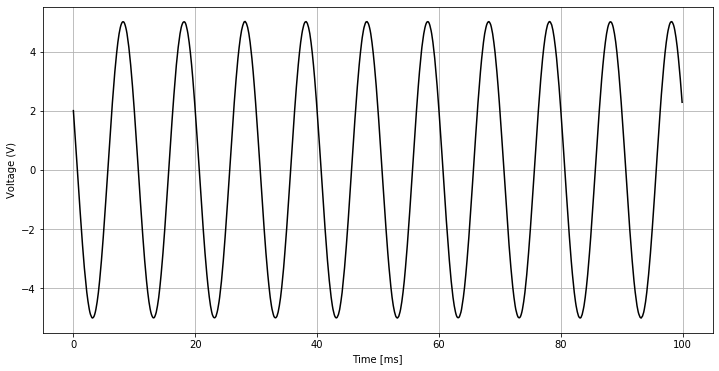
<center>figure 1. $f_s = 10,000\,Hz,\,N=1000$</center>
    
    
6. Using a 'live' output, adjust the DC offset and/or amplitude of the signal produced by the waveform generator to observe how the digital signal is clipped.

7. When you have a display that clearly illustrates clipping, stop the live output and acquire 100 ms of data. Ensure the data is saved to a file for use in your lab report. You should also report the DC offset, amplitude, and any other relevant waveform generator settings.
<br><p></p>
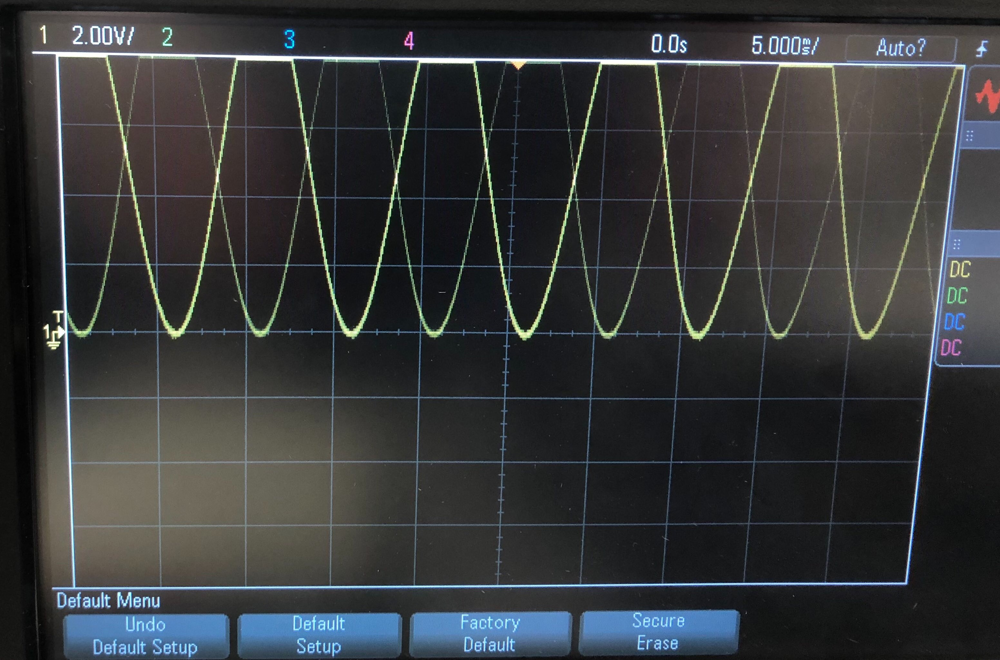<center>
figure 2a. Peak-peak amplitude 5V, DC offset raised to 2V to demonstrate clipping</center>

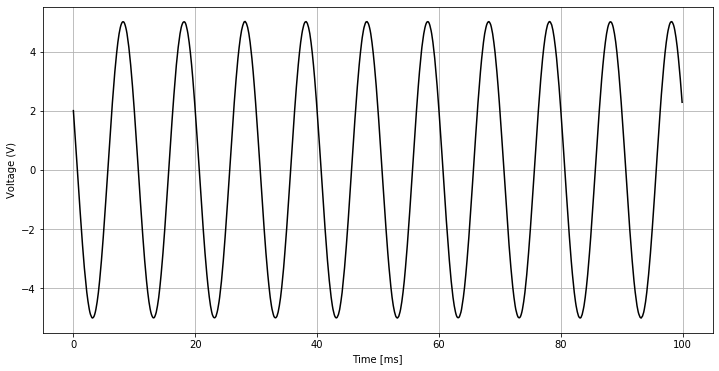
<center>figure 2b. Adjusted amplitude at 5V to demonstrate clipping; offset is 2V but the clipping and offset can't be seen from this display.</center>


## Part II - Aliasing
Here you will develop an anti-aliasing filter and verify its behavior. You will use the same circuit for Part III, so do not modify your circuit after this section.

1. Using the same configuration than previously ($f_s = 51.2\text{ Hz}$), now input a waveform of $f = 40\text{ Hz}$ and demonstrate aliasing. Estimate the apparent frequency analytically and compare it to the measured data. Take screenshots for your report.
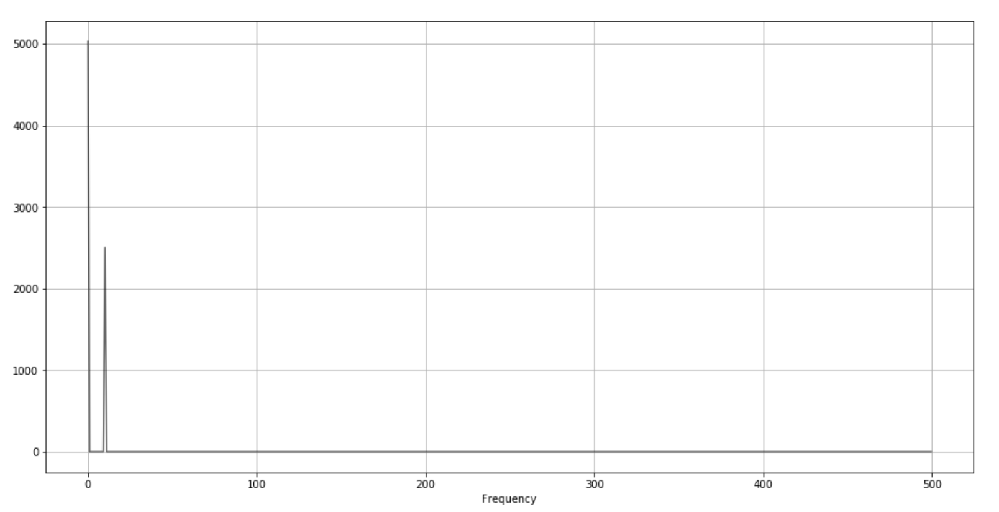
<center>figure 3. $f_s = 51.2\,Hz,\,N=1000$ with a 40 Hz sine wave</center>


> <font color="red"> Using: 
\begin{align*}
f_a =  \left| f - f_s \cdot \mathrm{NINT}\left( \frac{f}{f_s} \right) \right|
\end{align*}
    <p></p>It was calculated that the 40 Hz frequency is aliased as 11.2 Hz when sampled at 51.2 Hz</font>

2. You will now construct a first-order low-pass filter using a combination of resistors and capacitors. A circuit diagram for a simple first-order low-pass filter is provided below, the cutoff frequency is determined by: $f_\textit{cutoff} = \large \frac{1}{2\pi RC}$. Set the cutoff frequency at the sampling frequency record this signal without aliasing. Select the value of the resistor accordingly. Note: In all these circuits, it is critical that the ground bus be connected to a physical ground, such as the black ground post of the powered breadboard with the breadboard plugged in (but turned off) to secure the ground.

> <font color="red"> Using $f_\textit{cutoff} = \large \frac{1}{2\pi RC}$  and given a capacitor of 0.1 $ \mu$F the resistance needed was calculated: 
\begin{align*}
51.2=\frac{1}{2 \pi R(0.1 \times 10^{-6})}  
\Rightarrow R \approx 31,000 \Omega
\end{align*}

3. Test your filter by connecting the function generator to the filter input and the filter output to the DAQ board. Start with a sine wave input of about 5 Hz and amplitude 1V. Increase the frequency of the sine wave, doubling it every time, until you start noticing that the output amplitude decreases – the low-pass filter is doing its job. Keep increasing the frequency until the filter output amplitude is 90% attenuated – in other words, G = 0.1; the output amplitude is about 10% of the input amplitude, or 0.1V. At what frequency does this occur?
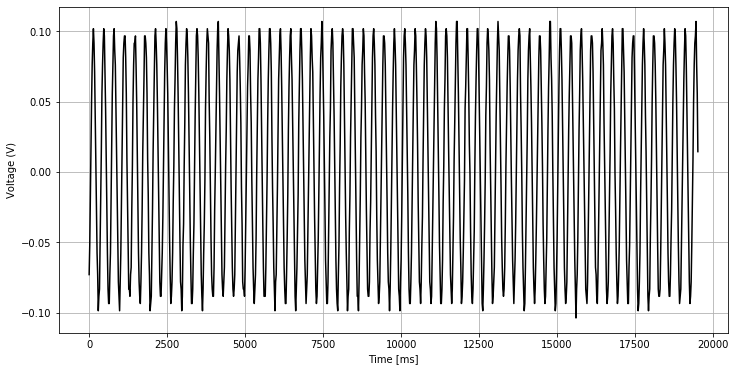
<center>figure 4. Sine wave at 510 Hz, yielding a 90% reduction in amplitude $\approx$ 0.1 V</center>

> <font color="red"> When the signal was sent at 510 Hz, G $\to$ 0.1 V

## Part III - Signal Reconstruction
A signal contaminated with a high-frequency noise will be simulated and its proper acquisition with an anti-aliasing filter studied in this section. This requires using advanced function in the waveform generator to generate the sum of two signals. The carrier wave is a sine wave, 10 Hz, 5V. The noise is a sine wave at 3.1 kHz with amplitude 1V.

1. Program the sum of the two sines in the waveform generator. In order to sum high frequency noise to carrier signal, go to modulate button on waveform function generator. Turn on modulate and choose sum under type, internal under source. Choose sine as shape of the noise and give the sum amplitude and frequency as it mentioned above.

2. Monitor that you have the proper signal on the oscilloscope.

3. Send the signal directly to the DAQ system (i.e. without going through the anti-aliasing filter that you have created).

4. Sample at 500 Hz with 1,024 data points per scan. You should observe the low frequency signal nicely, but the high frequency signal should yield some aliasing.

5. Save the time trace and recreate the frequency spectrum for your lab report. Estimate the frequency of the two signals from the frequency spectrum plot. Calculate the frequency resolution of your DAQ system for this sampling frequency and comment on the resolution of your signal.

> <font color="red"> $Resolution = \nabla V =  \large \frac{V_{max}-V_{min}}{2^{N}}$
>
> <font color="red"> ADC Resolution (N): 12-bit
>
> <font color="red"> $Resolution = \nabla V =  \large \frac{2.5-(-)2.5}{2^{12}}$
>
> $Resolution = 2.44 \times 10^{-3} V$ for this range of values, the resolution is very low. This is advantageous as resolution represents the size of the increments the DAQ uses to convert the analog signal to digital. Because the amplitude range is the same for the other sampling frequencies (and the DAS remains 12-bit), the resolution remains at $2.44 \times 10^{-3} V$.

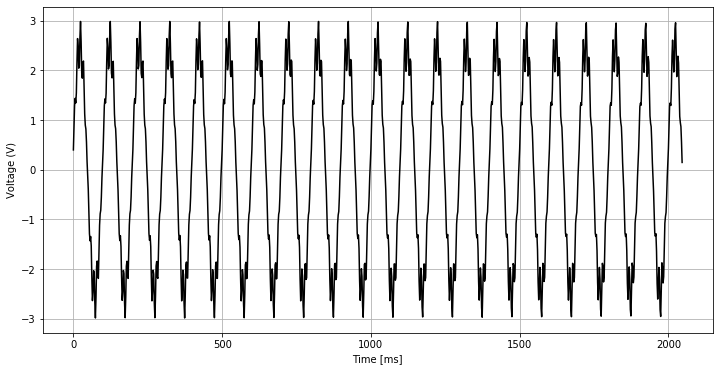
<center>figure 5. $f_s = 500\,Hz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal</center>

><font color="red">Examining the spectra plotted below and reverse-sloving the aliasing equation $f_{a} =  \left| f - f_s \cdot \mathrm{NINT}\left( \frac{f}{f_s} \right) \right|$ will yield the original frequencies. Inputting the desired signal component's frequency of 10 Hz will yield 10 Hz as its original frequency (it respects the Nyquist Shannon sampling rate theorem) while the 3.1 kHz "noise" does not respect this theorem and (using the above equation) is aliased as a signal with a frequency of 100 Hz.

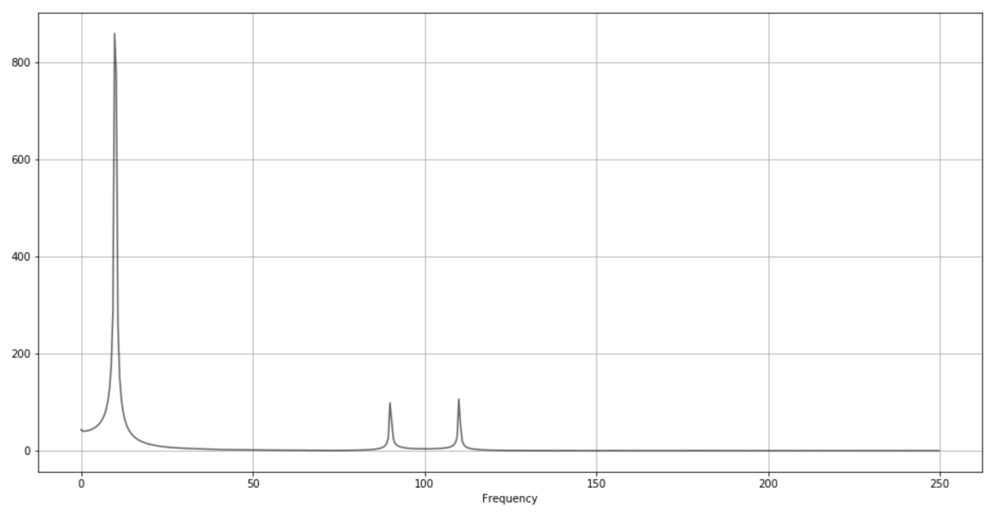
<center>figure 6. $f_s = 500\,Hz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal</center>

6. Redo Steps 4 & 5 with a sampling frequency of:
 - 1 kHz
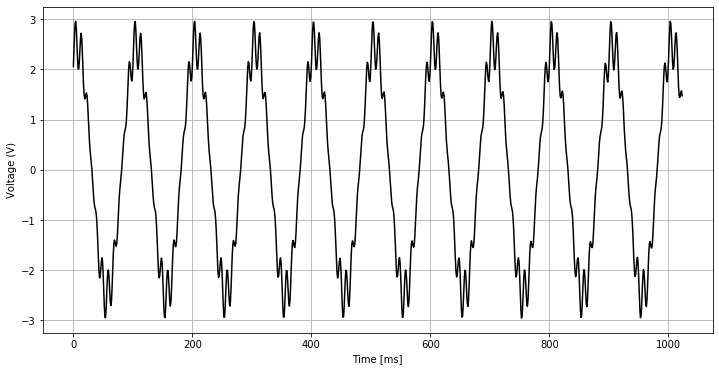
<center>figure 7a. $f_s = 1\,kHz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal</center>
<font color="red"> The apparent frequency using $f_{a} =  \left| f - f_s \cdot \mathrm{NINT}\left( \frac{f}{f_s} \right) \right|$ was calculated to be 100 Hz as shown in figure 7b. </font>
<img src="img/Lab3_05fft.png" width="700">
<center>figure 7b. $f_s = 1\,kHz,\,N=1024$, Frequency spectrum of 10 Hz carrier signal, 3.1 kHz noise signal</center>

 - 5 kHz
<img src="img/Lab3_06.png" width="700">
<center>figure 8a. $f_s = 5\,kHz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal</center>
<font color="red"> The apparent frequency was calculated to be 1900 Hz as shown in figure 8b. </font>
<img src="img/Lab3_06fft.png" width="700">
<center>figure 8b. $f_s = 5\,kHz,\,N=1024$, Frequency spectrum of 10 Hz carrier signal, 3.1 kHz noise signal</center>


 - 10 kHz
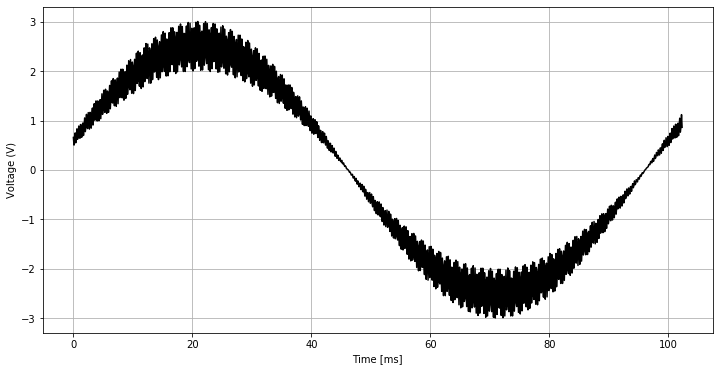
<center>figure 9a. $f_s = 10\,kHz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal</center><br><p></p>
<font color="red"> The apparent frequency was calculated to be 3100 Hz as shown in figure 9b. </font>
<img src="img/Lab3_07fft.png" width="700">
<center>figure 9b. $f_s = 10\,kHz,\,N=1024$, Frequency spectrum of 10 Hz carrier signal, 3.1 kHz noise signal</center>

7. Run the summed signal through the low-pass filter created previously. The low-pass filter is now acting as an anti-aliasing filter. Predict the amplitude of the noise and compare to the quantization error of your DAQ board.

> <font color="red"> The amplitude of the noise will be very near zero and almost undetectable by the DAQ board.
>
> <font color="red"> $Quantization$ $error = \pm \frac{1}{2}\cdot resolution= \pm \frac{1}{2} \times 2.44 \times 10^{-3} V= \pm 1.22 \times 10^{-3} V$


8. Reacquire signals for each sampling frequency, i.e. $f_s$ = 0.5, 1, 5, and 10 kHz. Record these traces into your lab report as well. Take particular note of the high frequency noise. Has it been reduced? Has it been totally eliminated? Record your observations.

> <font color="red"> As visible below, the high frequency noise has been completely filtered by the anti-aliasing filter. There is no interference in the signal as the high frequency noise has been totally elimnated.
 
 - 0.5 kHz
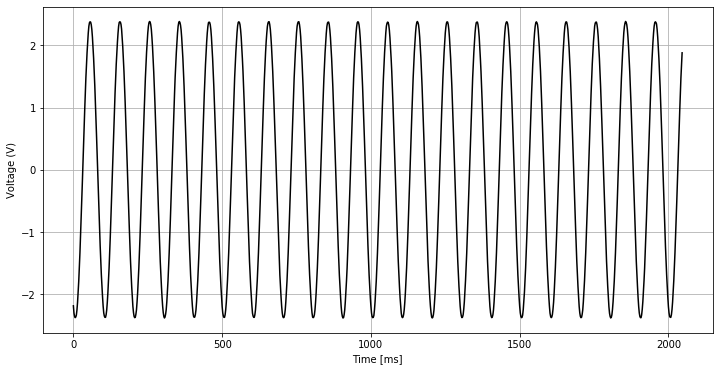
<center>figure 10a. $f_s = 500\,Hz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal; low-pass filter applied</center>
<img src="img/Lab3_08fft.png" width="700">
<center>figure 10b. $f_s = 0.5\,kHz,\,N=1024$, Frequency spectrum of 10 Hz carrier signal, 3.1 kHz noise signal</center>

 - 1 kHz
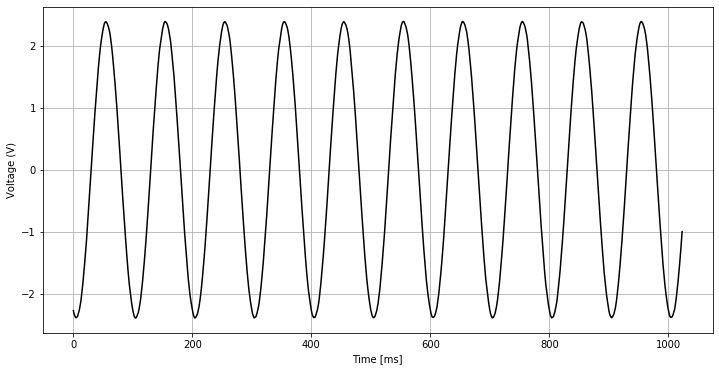
<center>figure 11a. $f_s = 1\,kHz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal; low-pass filter applied</center>
<img src="img/Lab3_09fft.png" width="700">
<center>figure 11b. $f_s = 1\,kHz,\,N=1024$, Frequency spectrum of 10 Hz carrier signal, 3.1 kHz noise signal; low-pass filter applied</center>

 - 5 kHz
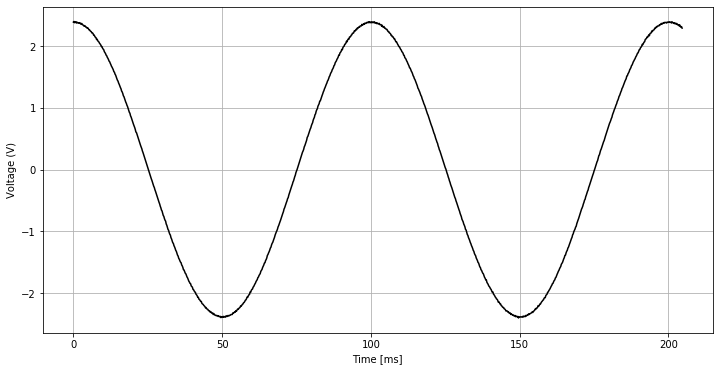
<center>figure 12a. $f_s = 5\,kHz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal; low-pass filter applied</center>
<img src="img/Lab3_10fft.png" width="700">
<center>figure 12b. $f_s = 5\,kHz,\,N=1024$, Frequency spectrum of 10 Hz carrier signal, 3.1 kHz noise signal; low-pass filter applied</center>

 - 10 kHz
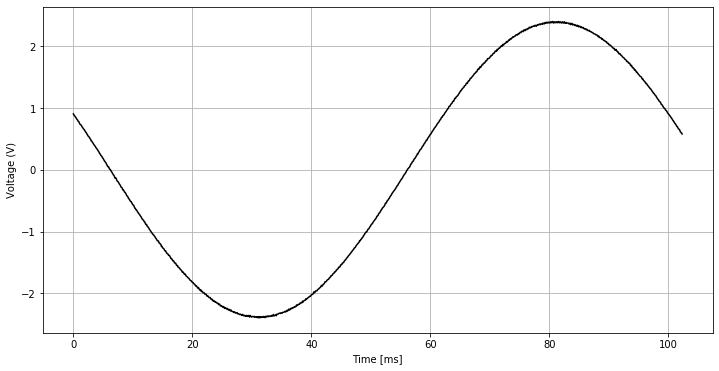
<center>figure 13a. $f_s = 10\,kHz,\,N=1024$, 10 Hz carrier signal, 3.1 kHz noise signal; low-pass filter applied</center>
<img src="img/Lab3_11fft.png" width="700">
<center>figure 13b. $f_s = 10\,kHz,\,N=1024$, Frequency spectrum of 10 Hz carrier signal, 3.1 kHz noise signal; low-pass filter applied</center>

## Tables

### Table 1

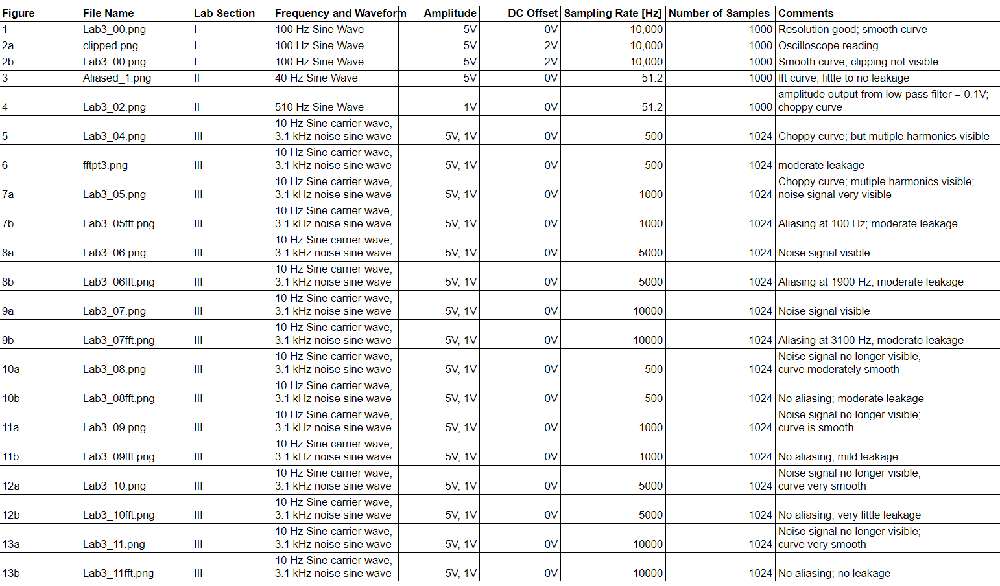

# Discussion Questions
1. Which statistical tool/graph could you use to identify if some clipping took place in your data? What would you expect to see?

> <font color="red"> In order to detect clipping, the derivative of the signal could be calculated; if the derivative is nearing either zero (signal flattens at maximum detection level) or infinity (steep dropoff due to "hard clipping") while the signal is approaching the maximum signal level. Both of these cases will indicate that clipping is most likely occurring during the data acquisition.

2. For Part III, did your anti-aliasing filter effectively remove the high frequency “noise”, while at the same time preserving the desired low frequency signal? Why or why not? Explain.

> <font color="red"> The anti-aliasing filter effectively removed the high frequency "noise" that was casing interference during the data acquisition. The desired signal was completely preserved. This is due to the fact that the cutoff ratio was determined to be 51.2 Hz; the desired signal component was well below this frequency at 10 Hz, while the "noise" signal of frequency 3.1 kHz was filtered out completely due to it being multitudes greater than the cutoff frequency. Additionally, the desired resistance needed for the low-pass filter was accurately replicated using three 10k$\Omega$ and two 500 $\Omega$ resistors in series effectively creating a 31 k$\Omega$ resistor. 

3. In Part III, which frequency was the optimum to record your signal? Hint: think about the frequency resolution.

> <font color="red"> A sampling rate of 5 kHz is the most advantageous sampling rate to utilize as it makes the most of balancing the temporal resolution and the frequency resolution. Higher temporal resolution increases acquisition accuracy while a higher frequency resolution minimizes leakage when analyzing the signal spectrum. 
    

# Conclusion

The purpose of this experiment was fulfilled. The low-pass filter was successfully assembled and tested. Figures 10-12 show the output signal from the filter. Figures 1-2b exemplify clipping and its dangers. Clipping can lead to incorrect signal output, but can be hard to see if the signal is plotted from the DAQ, shown in figure 2b. However, if the signal is viewed on an oscilloscope, figure 2a, it can be seen that clipping is occurring at an offset of $\approx$ 2V with a 5V amplitude. 

In Part II, the anti-aliasing filter was constructed and used to eliminate the aliasing that occurred in figure 3. Because the folding frequency was less than that of the signal, 51.2/2 < 40 Hz, aliasing occurred. The anti-aliasing filter was applied, yielding figure 4 which exhibits the 90% reduction in signal amplitude, or a gain of 0.1; 1V $\to$ 0.1V. 

Finally, the anti-aliasing filter was also used as a first order low-pass filter to remove noise from a 10 Hz signal. Specifically, the carrier wave was a sine wave, 10 Hz, 5V; the noise was a sine wave at 3.1 kHz with amplitude 1V. Using $f_\textit{cutoff} = \large \frac{1}{2\pi RC}$, the required impedance and capacitance were obtained and used to set up a simple circuit to filter the signal. As shown in figures 5-9, the 10 Hz sine curve appears to have many periodicities due to the 3.1 kHz noise. Viewing figures 10-12, the effectiveness of the filter is shown at both reducing the noise and reducing the aliasing. 
